In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import torch as t
from utils.config import opt
from model import FasterRCNNVGG16
from trainer import FasterRCNNTrainer
from data.util import  read_image
from utils.vis_tool import vis_bbox, vis_image
from utils import array_tool as at
import numpy as np
import h5py
from tqdm import tqdm
import matplotlib.pyplot as plt

%matplotlib inline

/home/tadenoud/.virtualenvs/ml/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
faster_rcnn = FasterRCNNVGG16()
trainer = FasterRCNNTrainer(faster_rcnn).cuda()

# Load model trained with caffe pretrained model

In [3]:
%ls ./checkpoints/cars

baseline_results.pickle                 gt_labels_test.pickle
fasterrcnn_04151829_0.6704369972064141  inv_mahal_cov.pickle
fasterrcnn_04151851_0.6877679369254311  kitti_features.pickle
fasterrcnn_04151914_0.7164561623943497  mahal_cov.pickle
fasterrcnn_04151958_0.7435728692746989  mahal_means.pickle
fasterrcnn_04152043_0.7459420675485349  mahal_result.pickle
fasterrcnn_04152235_0.7462277363985176  pred_bboxes_test.pickle
gt_bboxes_test.pickle                   pred_labels_test.pickle
gt_difficults_test.pickle               pred_scores_test.pickle
gt_labels.pickle                        tsne_features.pickle


In [4]:
trainer.load('./checkpoints/cars/fasterrcnn_04152235_0.7462277363985176')

FasterRCNNTrainer(
  (faster_rcnn): FasterRCNNVGG16(
    (extractor): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace)
      (16): MaxPoo

In [5]:
img = read_image('misc/demo.jpg')
img = t.from_numpy(img)[None]

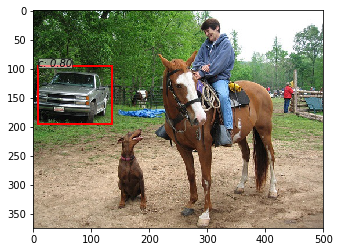

In [6]:
_bboxes, _labels, _scores = trainer.faster_rcnn.predict(img,visualize=True)

vis_bbox(at.tonumpy(img[0]),
         at.tonumpy(_bboxes[0]),
         at.tonumpy(_labels[0]).reshape(-1),
         at.tonumpy(_scores[0]).reshape(-1))

# Create a Pascal VOC data loader and classify some images

In [7]:
opt.voc_data_dir = '/home/tadenoud/Git/simple-faster-rcnn-pytorch/VOCdevkit/VOC2007/'


from data.dataset import Dataset, TestDataset, inverse_normalize
from torch.utils.data import DataLoader

testset = TestDataset(opt, split="test", img_type='jpg')
test_dataloader = DataLoader(testset,
                             batch_size=1,
                             num_workers=opt.test_num_workers,
                             shuffle=False,
                             pin_memory=True
                            )

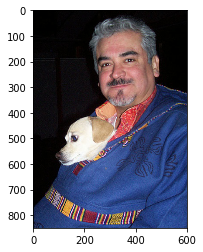

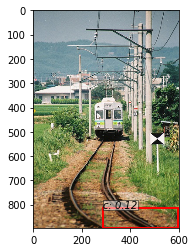

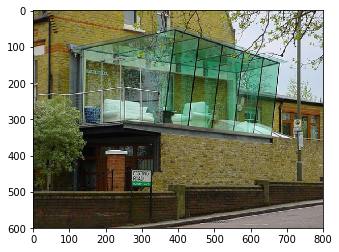

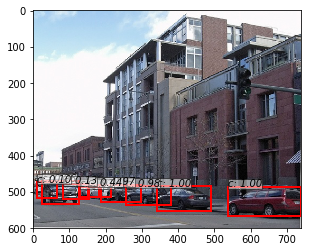

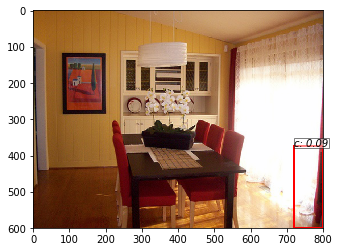

...

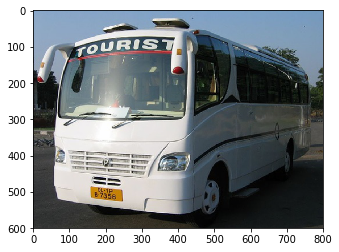

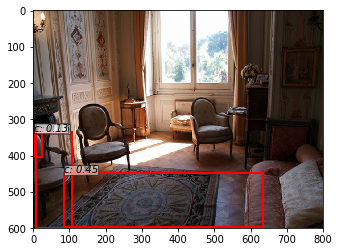

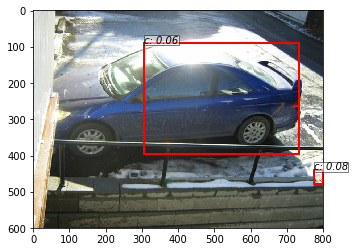

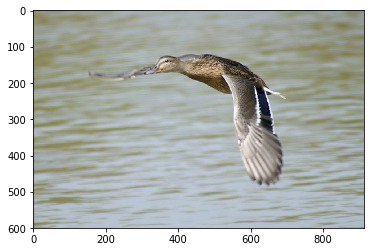

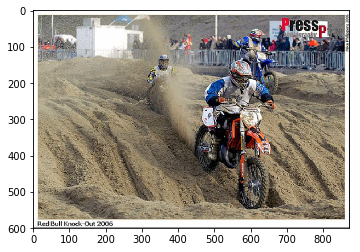

In [8]:
i = 0
for imgs, sizes, _, _, difficult in test_dataloader:    
    _, H, W = imgs.shape[1:]
    _bboxes, _labels, _scores = trainer.faster_rcnn.predict(at.totensor(imgs), [[H,W]])
    
    vis_bbox(inverse_normalize(at.tonumpy(imgs[0])),
             at.tonumpy(_bboxes[0]),
             at.tonumpy(_labels[0]).reshape(-1),
             at.tonumpy(_scores[0]).reshape(-1))
    
    plt.show()
    
    if i == 100:
        break
    i += 1